In [1]:
# Install Essential Libraries
!pip install ultralytics

Looking in indexes: https://pypi.org/simple, http://localhost:8081


In [2]:
# Import Essential Libraries
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

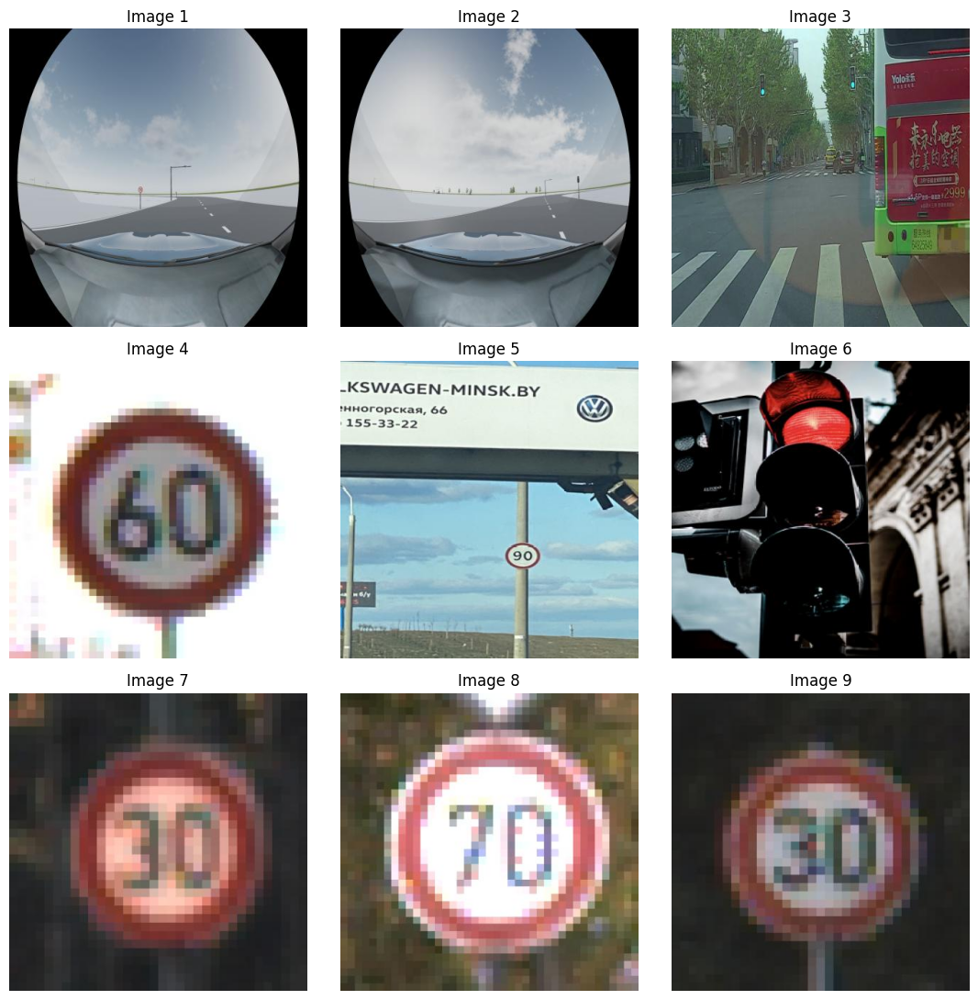

In [3]:
Image_dir = './datasets/cardetection/car/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [4]:
# Get the size of the image
image = cv2.imread("./datasets/cardetection/car/train/images/00000_00000_00012_png.rf.23f94508dba03ef2f8bd187da2ec9c26.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 416x416 and 3 channels.



WARNING ⚠️ NMS time limit 2.050s exceeded
image 1/1 /Users/thomasjones/workspace/UMKC/Fall2024/CS5567-0002/Project3/Part A/datasets/cardetection/car/train/images/000005_jpg.rf.d730849ae93a7c211a7c8f57ed851028.jpg: 640x640 1 car, 10.7ms
Speed: 67.2ms preprocess, 10.7ms inference, 4126.3ms postprocess per image at shape (1, 3, 640, 640)


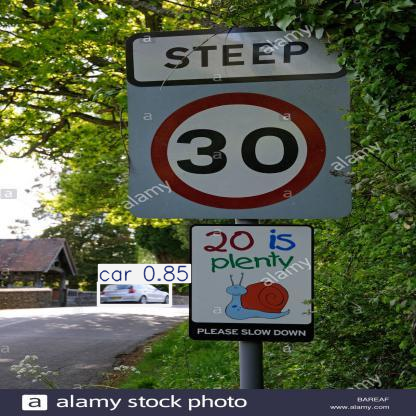

In [5]:
# Use a pretrained YOLOv8n model
model = YOLO("yolov8n.pt") 

# Use the model to detect object
image = "./datasets/cardetection/car/train/images/000005_jpg.rf.d730849ae93a7c211a7c8f57ed851028.jpg"
result_predict = model.predict(source = image, imgsz=(640), device='mps')

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [6]:
!pip install --upgrade ultralytics ray

Looking in indexes: https://pypi.org/simple, http://localhost:8081
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.4/887.4 kB 8.5 MB/s eta 0:00:00
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.3.32
    Uninstalling ultralytics-8.3.32:
      Successfully uninstalled ultralytics-8.3.32


In [7]:
# Build from YAML and transfer weights
Final_model = YOLO('yolov8n.pt')  

# Training The Final Model
# Result_Final_model = Final_model.train(data="./cardetection/car/data.yaml",epochs = 2, batch = 128, optimizer = 'sgd', lr0=0.1)
# Result_Final_model = Final_model.train(data="./cardetection/car/data.yaml",epochs = 20, batch = 128, optimizer = 'sgd', lr0=0.01, device='mps')
# Result_Final_model = Final_model.train(data="./cardetection/car/data.yaml",epochs = 20, batch = 128, optimizer = 'adam', lr0=0.001, device='mps')
Result_Final_model = Final_model.train(data="./cardetection/car/data.yaml",epochs = 40, batch = 128, optimizer = 'adam', lr0=0.001, device='mps')
# Result_Final_model = Final_model.train(data="./cardetection/car/data.yaml",epochs = 40, batch = 128, optimizer = 'adam', lr0=0.004, device='mps')
# Result_Final_model = Final_model.train(data="./cardetection/car/data.yaml",epochs = 60, batch = 64, optimizer = 'adam', lr0=0.002, dropout=0.3, device='mps')


New https://pypi.org/project/ultralytics/8.3.34 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.32 🚀 Python-3.10.15 torch-2.5.1 MPS (Apple M1 Ultra)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=./cardetection/car/data.yaml, epochs=40, time=None, patience=100, batch=128, imgsz=640, save=True, save_period=-1, cache=False, device=mps, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, sav

train: Scanning /Users/thomasjones/workspace/UMKC/Fall2024/CS5567-0002/Project3/Part A/datasets/cardetection/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]
val: Scanning /Users/thomasjones/workspace/UMKC/Fall2024/CS5567-0002/Project3/Part A/datasets/cardetection/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]

Plotting labels to runs/detect/train2/labels.jpg... 


optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.001), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      30.7G     0.8247      3.292      1.157        169        640: 100%|██████████| 28/28 [02:50<00:00,  6.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:26<00:00, 21.74s/it]


                   all        801        944     0.0415      0.291     0.0371     0.0299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      31.6G     0.7647      2.252      1.101        169        640: 100%|██████████| 28/28 [02:19<00:00,  4.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:36<01:49, 36.52s/it]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [01:12<01:12, 36.26s/it]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:58<00:00, 29.52s/it]

                   all        801        944     0.0298       0.22     0.0725     0.0376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40      31.8G      0.741      1.881      1.074        162        640: 100%|██████████| 28/28 [02:31<00:00,  5.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:36<01:49, 36.46s/it]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [01:14<01:14, 37.22s/it]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [01:47<00:35, 35.50s/it]

WARNING ⚠️ NMS time limit 3.650s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:53<00:00, 28.27s/it]

                   all        801        944     0.0495      0.268     0.0901     0.0722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      31.2G      0.719      1.676      1.069        134        640: 100%|██████████| 28/28 [02:46<00:00,  5.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:53<02:39, 53.06s/it]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [01:42<01:41, 50.79s/it]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [02:25<00:00, 36.41s/it]


                   all        801        944      0.309      0.252      0.155      0.111

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      31.3G     0.7211      1.512      1.066        158        640: 100%|██████████| 28/28 [02:50<00:00,  6.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:56<00:00, 14.19s/it]

                   all        801        944      0.404      0.552      0.464      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      31.4G      0.706      1.348      1.058        154        640: 100%|██████████| 28/28 [02:52<00:00,  6.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:51<00:00, 12.98s/it]

                   all        801        944      0.403      0.531      0.448      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      31.8G     0.6851      1.251      1.042        137        640: 100%|██████████| 28/28 [02:45<00:00,  5.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 14.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:33<00:00, 23.36s/it]


                   all        801        944      0.496      0.494      0.489      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      32.2G     0.6702      1.139      1.029        177        640: 100%|██████████| 28/28 [02:43<00:00,  5.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:12<00:00, 18.24s/it]

                   all        801        944      0.584      0.651      0.636      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40      31.3G     0.6499      1.056      1.017        174        640: 100%|██████████| 28/28 [02:50<00:00,  6.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:09<00:00, 17.34s/it]


                   all        801        944      0.647      0.609      0.658      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40      31.4G     0.6511          1      1.019        160        640: 100%|██████████| 28/28 [02:54<00:00,  6.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.87s/it]

                   all        801        944      0.832      0.739      0.836      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      32.5G     0.6498     0.9721      1.018        154        640: 100%|██████████| 28/28 [02:47<00:00,  5.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:52<00:00, 13.05s/it]

                   all        801        944      0.695      0.698      0.778       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      32.2G     0.6326     0.9461       1.01        157        640: 100%|██████████| 28/28 [02:49<00:00,  6.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:06<00:00, 16.71s/it]


                   all        801        944      0.831       0.72      0.839      0.693

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      31.7G     0.6365     0.9344      1.011        155        640: 100%|██████████| 28/28 [03:06<00:00,  6.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:08<00:00, 17.05s/it]


                   all        801        944      0.821       0.82      0.871      0.729

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40        31G     0.6089     0.8892     0.9956        148        640: 100%|██████████| 28/28 [03:09<00:00,  6.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:10<00:00, 17.73s/it]


                   all        801        944      0.844      0.767      0.867      0.729

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      32.1G     0.6078     0.8507     0.9884        157        640: 100%|██████████| 28/28 [03:11<00:00,  6.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:57<00:00, 14.26s/it]

                   all        801        944      0.896        0.8      0.891      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      31.2G     0.6077     0.8278     0.9943        183        640: 100%|██████████| 28/28 [03:21<00:00,  7.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:56<00:00, 14.23s/it]


                   all        801        944      0.904      0.777      0.875      0.733

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40        31G      0.606     0.8057     0.9955        143        640: 100%|██████████| 28/28 [03:16<00:00,  7.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:47<00:00, 11.76s/it]


                   all        801        944      0.913      0.812      0.911      0.761

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      31.9G     0.5878     0.7755     0.9828        162        640: 100%|██████████| 28/28 [03:10<00:00,  6.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:14<00:00, 18.72s/it]


                   all        801        944      0.904      0.821      0.914       0.77

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      31.2G      0.578     0.7484     0.9838        156        640: 100%|██████████| 28/28 [03:19<00:00,  7.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:46<00:00, 11.61s/it]


                   all        801        944       0.88      0.827      0.906      0.765

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      31.4G     0.5723     0.7405     0.9741        162        640: 100%|██████████| 28/28 [03:13<00:00,  6.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:03<00:00, 15.81s/it]


                   all        801        944      0.921      0.831       0.92      0.782

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      31.9G     0.5843     0.7501     0.9848        169        640: 100%|██████████| 28/28 [03:18<00:00,  7.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [01:03<00:00, 15.90s/it]


                   all        801        944      0.899      0.837      0.924      0.787

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      31.3G     0.5735     0.7163     0.9803        147        640: 100%|██████████| 28/28 [02:55<00:00,  6.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  7.00s/it]


                   all        801        944      0.924      0.857      0.924      0.784

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      31.4G       0.57     0.7117      0.983        165        640: 100%|██████████| 28/28 [03:03<00:00,  6.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:24<00:00,  6.08s/it]


                   all        801        944      0.946      0.865      0.933      0.796

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      31.9G     0.5561     0.6908     0.9683        179        640: 100%|██████████| 28/28 [02:56<00:00,  6.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.97s/it]


                   all        801        944      0.923      0.847      0.925      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      31.4G     0.5525       0.68     0.9686        155        640: 100%|██████████| 28/28 [03:03<00:00,  6.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:24<00:00,  6.07s/it]


                   all        801        944      0.938      0.843      0.924       0.79

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      31.3G     0.5577     0.6542     0.9693        149        640: 100%|██████████| 28/28 [02:47<00:00,  5.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.57s/it]


                   all        801        944      0.939       0.85      0.934      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      31.3G     0.5525     0.6471     0.9693        178        640: 100%|██████████| 28/28 [03:10<00:00,  6.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.55s/it]


                   all        801        944      0.945       0.85      0.938      0.801

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40      31.3G     0.5462     0.6478     0.9647        166        640: 100%|██████████| 28/28 [03:00<00:00,  6.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:25<00:00,  6.31s/it]


                   all        801        944      0.934      0.873      0.942       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      31.3G     0.5402     0.6469     0.9659        171        640: 100%|██████████| 28/28 [03:03<00:00,  6.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.55s/it]


                   all        801        944      0.937       0.87      0.942       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      32.1G      0.541     0.6213     0.9593        180        640: 100%|██████████| 28/28 [03:09<00:00,  6.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:25<00:00,  6.33s/it]


                   all        801        944      0.945      0.877      0.949       0.81
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      31.3G     0.5433     0.4488     0.9366         84        640: 100%|██████████| 28/28 [03:57<00:00,  8.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.92s/it]

                   all        801        944       0.92      0.889      0.949      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40        31G     0.5329      0.415      0.925         86        640: 100%|██████████| 28/28 [03:45<00:00,  8.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.08s/it]


                   all        801        944      0.926      0.898      0.949       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40        31G     0.5295     0.3989     0.9281         77        640: 100%|██████████| 28/28 [03:32<00:00,  7.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.95s/it]


                   all        801        944      0.961      0.884      0.953      0.809

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      31.2G     0.5183     0.3858     0.9207         98        640: 100%|██████████| 28/28 [03:35<00:00,  7.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.01s/it]


                   all        801        944      0.957      0.884      0.953      0.811

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      31.3G     0.5169     0.3824     0.9209         93        640: 100%|██████████| 28/28 [03:17<00:00,  7.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:25<00:00,  6.42s/it]


                   all        801        944      0.939      0.891      0.956      0.824

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      31.1G     0.5067     0.3639      0.914         86        640: 100%|██████████| 28/28 [03:18<00:00,  7.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:25<00:00,  6.47s/it]


                   all        801        944      0.951      0.888      0.954      0.821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      31.2G     0.4999     0.3538     0.9086         82        640: 100%|██████████| 28/28 [03:21<00:00,  7.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.63s/it]


                   all        801        944      0.967      0.886       0.96      0.827

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40        31G     0.4983     0.3528     0.9121         86        640: 100%|██████████| 28/28 [03:24<00:00,  7.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.58s/it]


                   all        801        944      0.957       0.89      0.961      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      31.3G     0.4908     0.3459     0.9094         88        640: 100%|██████████| 28/28 [03:23<00:00,  7.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:25<00:00,  6.48s/it]


                   all        801        944      0.948      0.902      0.961      0.836

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      31.1G     0.4819     0.3333     0.9045         91        640: 100%|██████████| 28/28 [03:14<00:00,  6.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:25<00:00,  6.41s/it]


                   all        801        944      0.953      0.904      0.964      0.834

40 epochs completed in 2.652 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.32 🚀 Python-3.10.15 torch-2.5.1 MPS (Apple M1 Ultra)
Model summary (fused): 168 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:53<00:00, 13.48s/it]


                   all        801        944      0.946      0.903      0.961      0.836
           Green Light         87        122       0.85      0.743      0.851      0.504
             Red Light         74        108      0.845       0.76      0.845      0.523
       Speed Limit 100         52         52      0.971      0.942      0.988      0.901
       Speed Limit 110         17         17      0.943      0.977      0.989      0.919
       Speed Limit 120         60         60          1      0.914      0.993       0.92
        Speed Limit 20         56         56      0.984      0.982      0.986      0.875
        Speed Limit 30         71         74      0.935      0.959      0.987      0.926
        Speed Limit 40         53         55      0.956      0.891      0.977       0.88
        Speed Limit 50         68         71      0.991      0.873      0.968      0.868
        Speed Limit 60         76         76      0.931      0.934      0.966      0.888
        Speed Limit 7

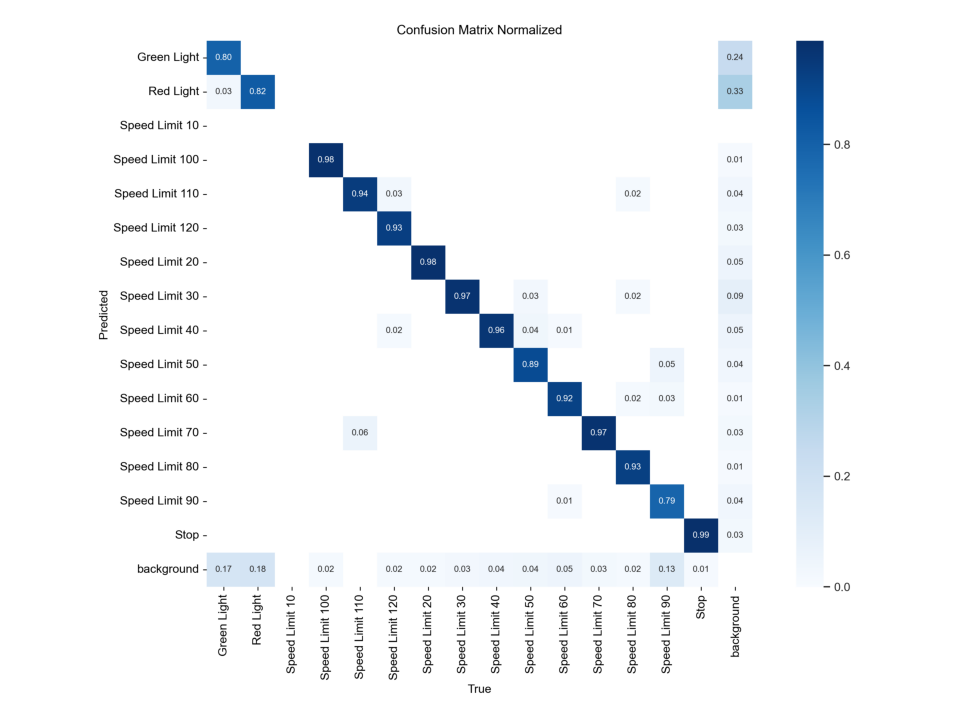

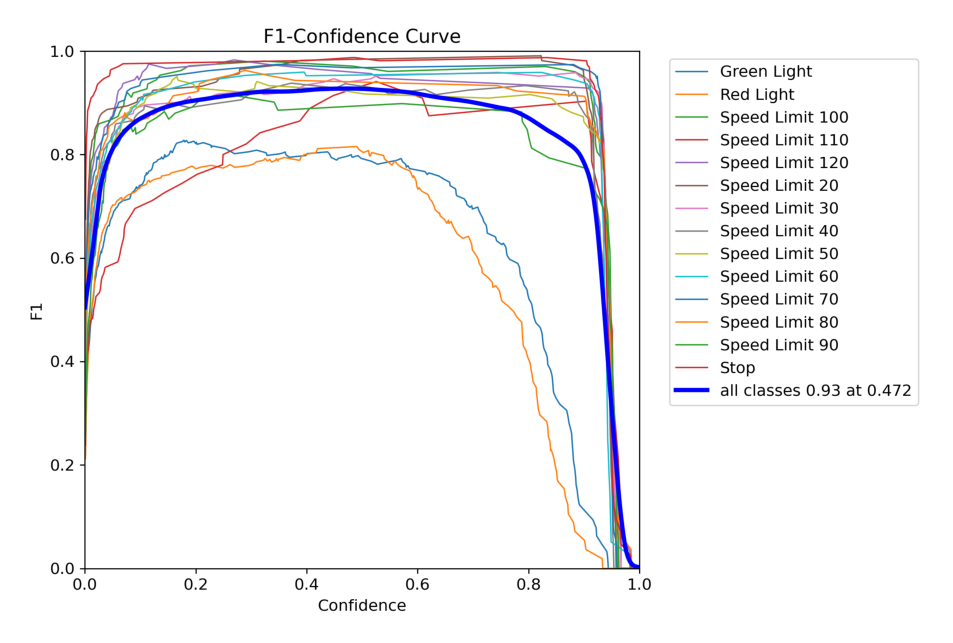

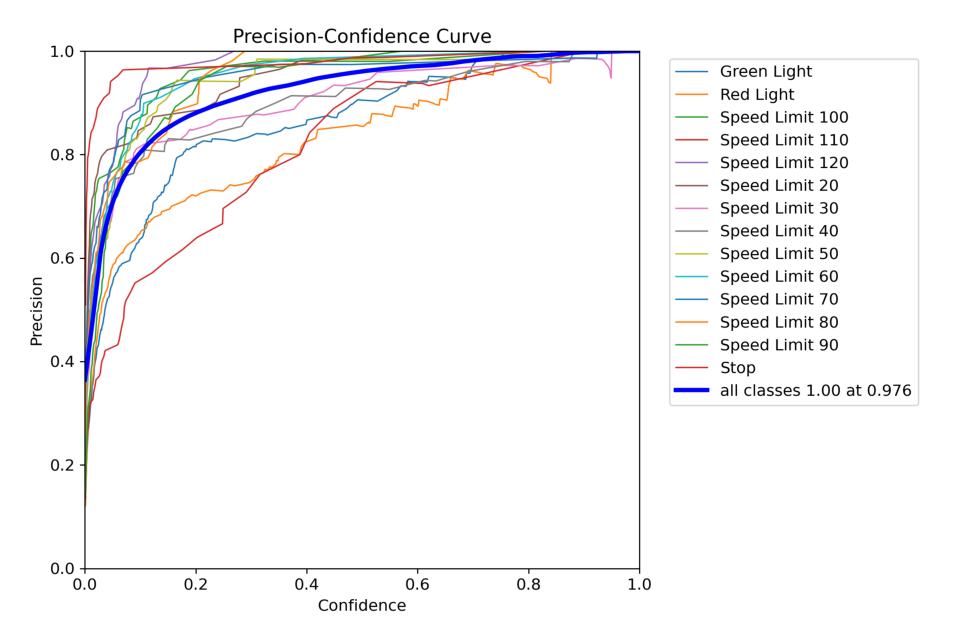

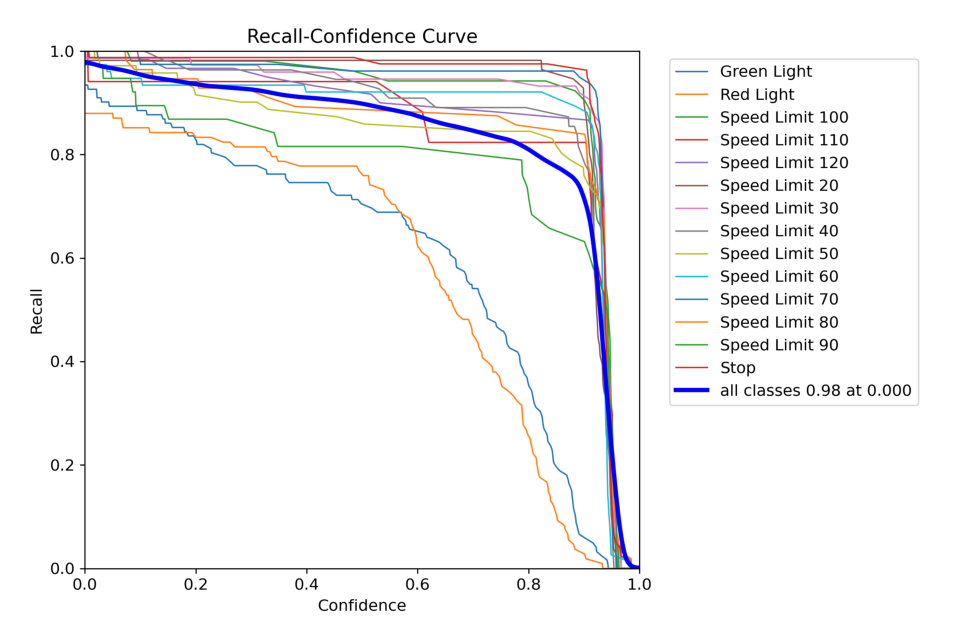

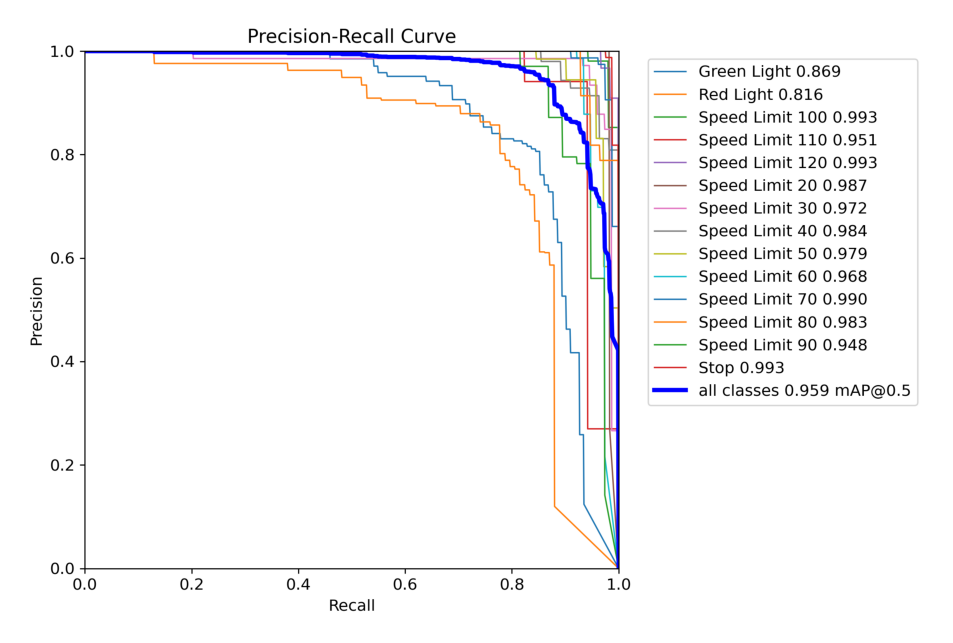

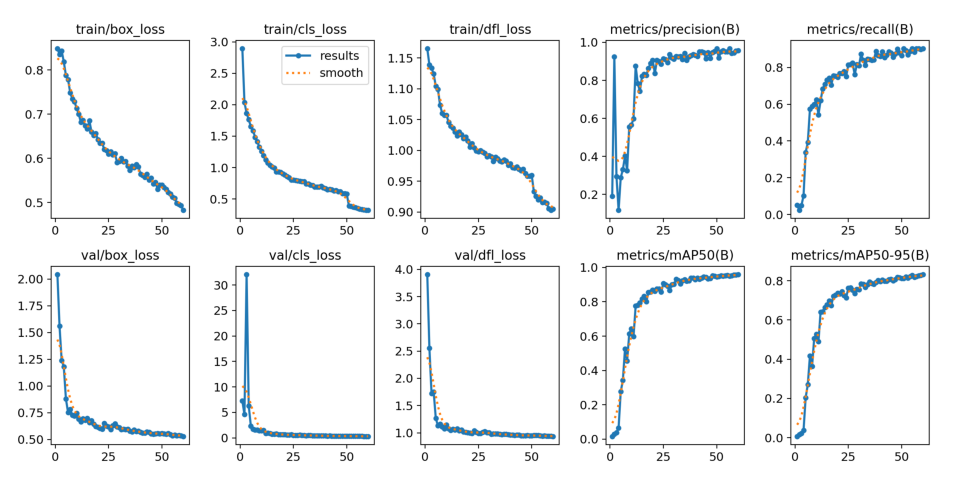

In [8]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = './runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)


In [9]:
Result_Final_model = pd.read_csv('./runs/detect/train/results.csv')
Result_Final_model.head(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,180.222,0.84864,2.89568,1.16554,0.19002,0.05234,0.01569,0.00687,2.04273,7.28141,3.90546,0.067917,0.000655,0.000655
1,2,393.294,0.83503,2.03530,1.13876,0.92533,0.02364,0.02807,0.01527,1.55969,4.59877,2.55359,0.035228,0.001300,0.001300
2,3,847.247,0.84317,1.86575,1.13379,0.29551,0.04895,0.03833,0.02206,1.23973,32.05380,1.72407,0.002518,0.001922,0.001922
3,4,1289.130,0.81831,1.76236,1.12417,0.11676,0.10217,0.06553,0.03691,1.18166,6.29424,1.75367,0.001901,0.001901,0.001901
4,5,1705.200,0.78744,1.65261,1.10403,0.28877,0.33866,0.27618,0.20463,0.87925,2.32779,1.26568,0.001868,0.001868,0.001868
5,6,2115.100,0.77823,1.58830,1.09943,0.33037,0.39200,0.34227,0.27107,0.75300,1.71496,1.13065,0.001835,0.001835,0.001835
6,7,2505.790,0.74872,1.48402,1.07325,0.40263,0.57272,0.52466,0.41678,0.78329,1.56240,1.15766,0.001802,0.001802,0.001802
7,8,2846.620,0.73459,1.41139,1.06041,0.32589,0.58828,0.45506,0.36295,0.72713,1.59748,1.11113,0.001769,0.001769,0.001769
8,9,3238.600,0.72844,1.32626,1.05719,0.55612,0.59984,0.61463,0.50673,0.72031,1.41063,1.07684,0.001736,0.001736,0.001736
9,10,3579.060,0.71347,1.25720,1.05681,0.56503,0.62347,0.64320,0.52845,0.74643,1.40434,1.14289,0.001703,0.001703,0.001703


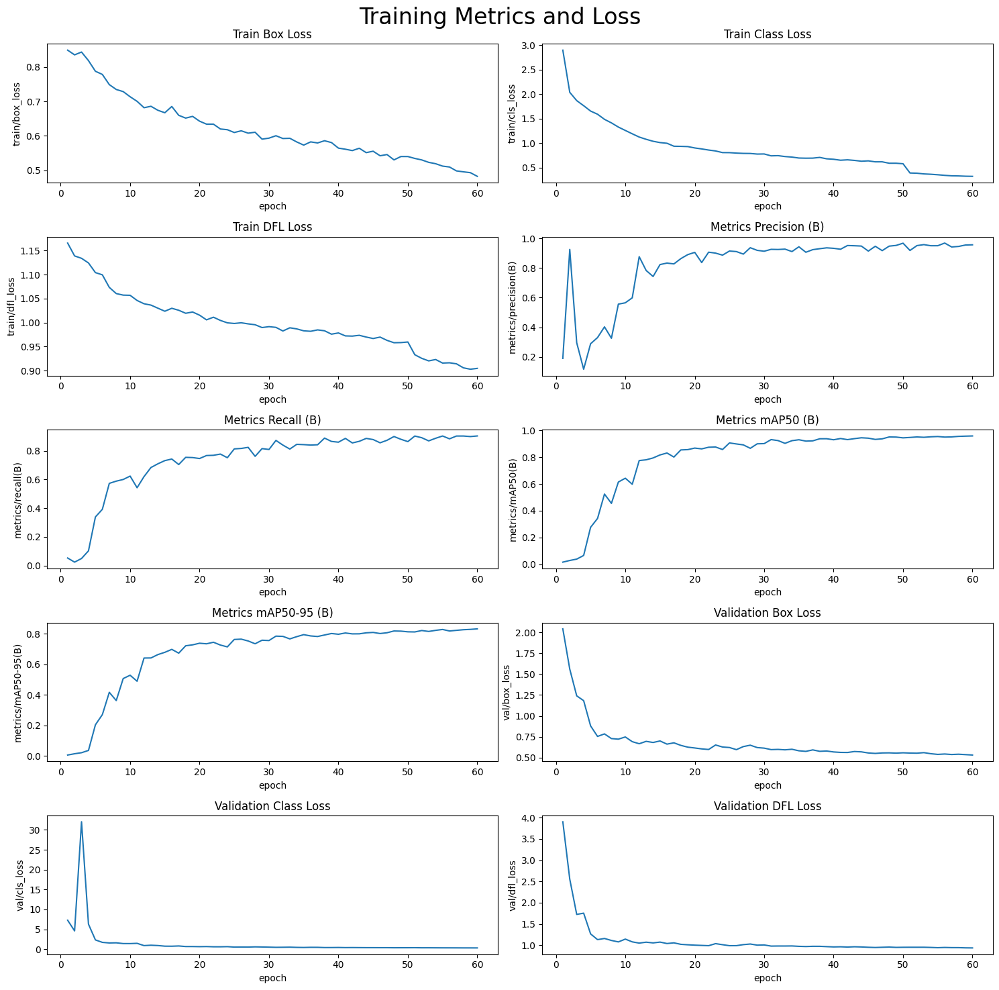

In [10]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [11]:
# Loading the best performing model
Valid_model = YOLO('./runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.32 🚀 Python-3.10.15 torch-2.5.1 CPU (Apple M1 Ultra)
Model summary (fused): 168 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /Users/thomasjones/workspace/UMKC/Fall2024/CS5567-0002/Project3/Part A/datasets/cardetection/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [02:22<00:00,  2.80s/it]


                   all        801        944      0.956      0.903      0.959      0.831
           Green Light         87        122      0.887      0.721      0.869      0.528
             Red Light         74        108      0.854      0.778      0.816      0.485
       Speed Limit 100         52         52       0.98      0.963      0.993      0.912
       Speed Limit 110         17         17      0.903      0.941      0.951      0.894
       Speed Limit 120         60         60          1      0.924      0.993      0.917
        Speed Limit 20         56         56      0.985      0.982      0.987      0.864
        Speed Limit 30         71         74      0.933      0.946      0.972      0.925
        Speed Limit 40         53         55      0.927      0.945      0.984      0.872
        Speed Limit 50         68         71      0.984      0.869      0.979      0.872
        Speed Limit 60         76         76      0.988      0.921      0.968      0.883
        Speed Limit 7


0: 640x640 1 Speed Limit 80, 57.4ms
Speed: 2.3ms preprocess, 57.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 30, 36.9ms
Speed: 0.9ms preprocess, 36.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Green Lights, 34.4ms
Speed: 0.8ms preprocess, 34.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 40, 39.7ms
Speed: 1.0ms preprocess, 39.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 37.1ms
Speed: 0.8ms preprocess, 37.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Green Light, 36.0ms
Speed: 0.8ms preprocess, 36.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 100, 35.3ms
Speed: 0.8ms preprocess, 35.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Red Lights, 41.5ms
Speed: 0.7ms preprocess, 41.5ms infere

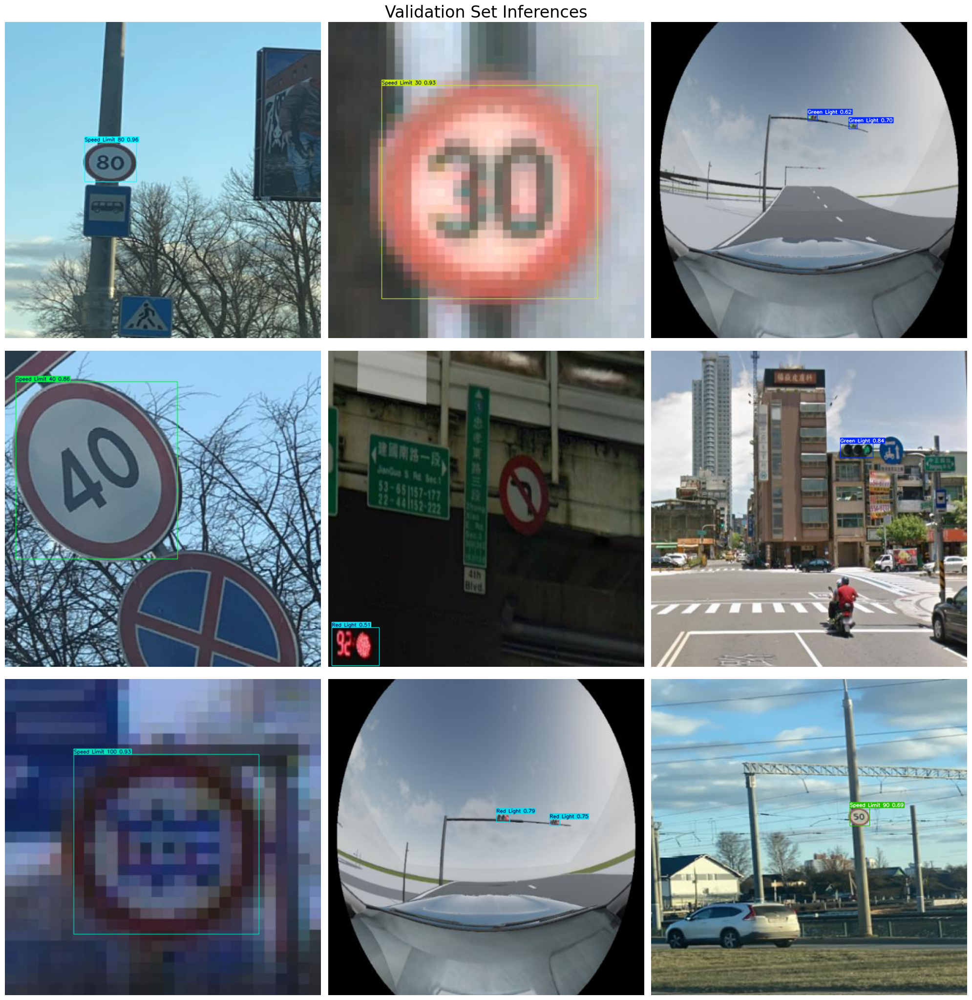

In [12]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = './datasets/cardetection/car'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


In [13]:
import shutil
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join('./runs/detect/train', 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)
# Define the path to the sample video in the dataset
dataset_video_path = './datasets/cardetection/video.mp4'

# Define the destination path in the working directory
video_path = './sample_video.avi'

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/508) /Users/thomasjones/workspace/UMKC/Fall2024/CS5567-0002/Project3/Part A/sample_video.avi: 640x640 1 Stop, 40.8ms
video 1/1 (frame 2/508) /Users/thomasjones/workspace/UMKC/Fall2024/CS5567-0002/Project3/Part A/sample_video.avi: 640x640 1 Stop, 39.2ms
video 1/1 (frame 3/508) /Users/thomasjones/workspace/UMKC/Fall2024/CS5567-0002/Project3/Part A/sample_video.avi: 640x640 1 Stop, 38.6ms
video 1/1 (frame 4/508) /Users/thomasjones/works

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Green Light', 1: 'Red Light', 2: 'Speed Limit 10', 3: 'Speed Limit 100', 4: 'Speed Limit 110', 5: 'Speed Limit 120', 6: 'Speed Limit 20', 7: 'Speed Limit 30', 8: 'Speed Limit 40', 9: 'Speed Limit 50', 10: 'Speed Limit 60', 11: 'Speed Limit 70', 12: 'Speed Limit 80', 13: 'Speed Limit 90', 14: 'Stop'}
 obb: None
 orig_img: array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
     

In [14]:
# Convert the .avi video generated by the YOLOv8 prediction to .mp4 format for compatibility with notebook display
!ffmpeg -y -loglevel panic -i sample_video.avi processed_sample_video.mp4

# Embed and display the processed sample video within the notebook
Video("processed_sample_video.mp4", embed=True, width=960)